## Function Util

In [1]:
include("until.jl")

plot_equilibrium_3D (generic function with 1 method)

In [32]:

function conservation_plot_3D(N_data,P_data,Z_data,times,space)
    ## pre-define a vector to record the total concentration over time
    total_con = sum(N_data, dims=1) .+ sum(P_data, dims=1) .+ sum(Z_data,dims=1)
    total_con_vector = vec(total_con)
    # Plot the row sums against the time vector
    plot(times, total_con_vector, xlabel="Time", ylabel="sum con over time", title="total concentration over time",ylim=(220,230),label="total population")
end


conservation_plot_3D (generic function with 1 method)

## ODE Stability

In [2]:
Nₜ = 1.75:0.01:3
λ, ν = 0.85, 2
δ, g, m = 1, 2, 1/2
d₂, d₃, k = 0, 0, 1
d₁ = 0;

In [3]:
function ODE_system_3D(N̄, P̄, Z̄ , λ, ν, δ, g, m, d₁, d₂, d₃)
    
   Nᵢ,Pᵢ,Zᵢ=N̄, P̄, Z̄


   ## Define the Jacobian matrix at equilibrium states
   A=[-ν*Pᵢ/((1+Nᵢ)^2)   -ν*(Nᵢ/(Nᵢ+1))+ m*λ*Pᵢ^(m-1)    δ
      ν*Pᵢ/((1+Nᵢ)^2)   ν*(Nᵢ/(Nᵢ+1))-g*Zᵢ/((1+Pᵢ)^2)-m*λ*Pᵢ^(m-1)  -g*Pᵢ/(1+Pᵢ)
      0                 g*Zᵢ/((1+Pᵢ)^2)      0]
   ## define the linear approximation matrix for PDE system
   ode_mat=A

   eigen_ode=eigen(ode_mat).values
   eigen_vec=(eigen(ode_mat).vectors)
   

    
   return(eigen_ode, eigen_vec)
end

ODE_system_3D (generic function with 1 method)

In [4]:
total_population=2.6
N̄, P̄, Z̄= equilibrium_state_3D([total_population], λ, ν, δ, g, m)
N̄, P̄, Z̄=N̄[1], P̄[1], Z̄[1]

eigen_ode, eigen_vec = ODE_system_3D(N̄, P̄, Z̄ , λ, ν, δ, g, m, d₁, d₂, d₃)


(ComplexF64[1.1175444337385128e-16 + 0.0im, 0.09722491959726919 - 0.43220022747540215im, 0.09722491959726919 + 0.43220022747540215im], ComplexF64[-0.9368089504126146 + 0.0im -0.7280986040219346 - 0.0im -0.7280986040219346 + 0.0im; 1.5585872611707621e-16 + 0.0im 0.6259072392616619 - 0.18394221324860202im 0.6259072392616619 + 0.18394221324860202im; -0.34984137895168366 + 0.0im 0.10219136476027253 + 0.183942213248602im 0.10219136476027253 - 0.183942213248602im])

In [6]:
eigen_ode

3-element Vector{ComplexF64}:
 1.1175444337385128e-16 + 0.0im
    0.09722491959726919 - 0.43220022747540215im
    0.09722491959726919 + 0.43220022747540215im

In [7]:
eigen_vec

3×3 Matrix{ComplexF64}:
   -0.936809+0.0im  -0.728099-0.0im       -0.728099+0.0im
 1.55859e-16+0.0im   0.625907-0.183942im   0.625907+0.183942im
   -0.349841+0.0im   0.102191+0.183942im   0.102191-0.183942im

## Heat map with various diffusion coefficient

Now we study how the variation of of $d_1$ affects the value of PDE

In [13]:
Nₜ = 1.75:0.01:3
λ, ν = 0.85, 2
δ, g, m = 1, 2, 1/2
d₂, d₃, k = 0.01, 0.01, 1
d₁ = 0:0.01:1

ODE_eigen = zeros(Float64, length(Nₜ), length(d₁))
PDE_eigen = zeros(Float64, length(Nₜ), length(d₁))

for i in 1:length(d₁)
    for j in 1:length(Nₜ)
        ODE_eigen[j,i], PDE_eigen[j,i], _ = ODE_PDE_system_3D(Nₜ, λ, ν, δ, g, m, d₁[i], d₂, d₃, k)[j]
    end
end

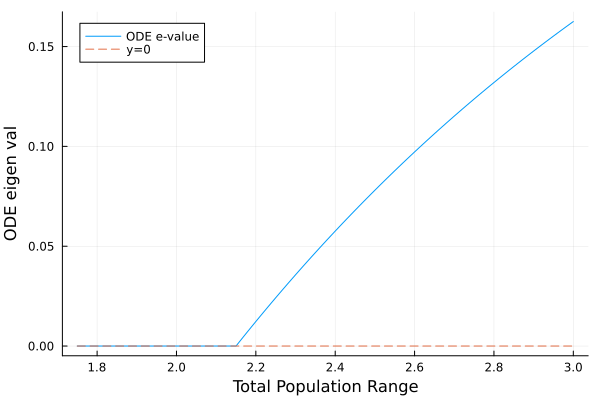

In [14]:
plot(Nₜ, ODE_eigen[:,1], xlabel="Total Population Range", ylabel="ODE eigen val", label="ODE e-value")
plot!(Nₜ, zeros(length(Nₜ)), label="y=0", linestyle=:dash)

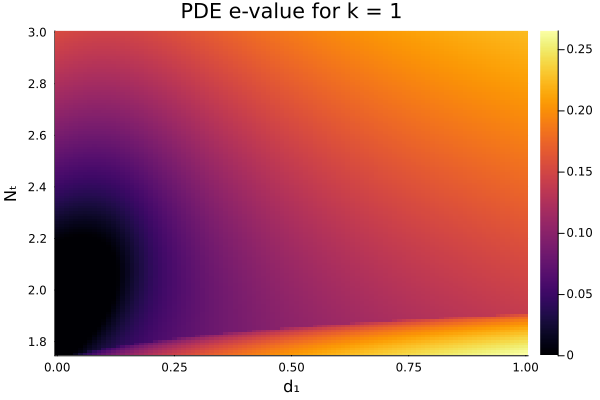

In [15]:
heatmap(d₁, Nₜ, max.(PDE_eigen, 0),
    xlabel = "d₁",
    ylabel = "Nₜ",
    title = "PDE e-value for k = $k",  # Ensure aspect ratio is equal for clarity
    colorbar = true,
)

## Parameter

In [16]:
Nₜ = 1.75:0.05:3
λ, ν = 0.85, 2
δ, g, m = 1, 2, 1/2
d₁, d₂, d₃, k = 1, 0.01, 0.01, 1;

we decide to set up 2 different total population corresponding to 2 different modes in the heat map

In [17]:
idx = findall(x -> x == 1.75, Nₜ)

## Use the following total population
total_population_mode1=Nₜ[idx]
total_population_mode1=total_population_mode1[1]


N̄, P̄, Z̄= equilibrium_state_3D(Nₜ, λ, ν, δ, g, m)

N̄, P̄, Z̄=N̄[idx][1], P̄[idx][1], Z̄[idx][1]


(0.745683229480096, 1.0, 0.0043167705199040896)

In [37]:
idx = findall(x -> x == 2.2, Nₜ)

## Use the following total population
total_population_mode2=Nₜ[idx]
total_population_mode2=total_population_mode2[1]


N̄, P̄, Z̄= equilibrium_state_3D(Nₜ, λ, ν, δ, g, m)

N̄, P̄, Z̄=N̄[idx][1], P̄[idx][1], Z̄[idx][1]


(0.9340822079655831, 1.0, 0.2659177920344171)

## Initial Condition

In [43]:
## Pre-define the mode number k
k=5

function N_initial_cond(x)
    C₁=real(ODE_PDE_system_3D(total_population_mode1, λ, ν, δ, g, m, d₁, d₂, d₃, k)[1][4][1])
    N = N̄+1e-4*C₁*cos(k*x)
    return(N)
end


function P_initial_cond(x)
    C₂=real(ODE_PDE_system_3D(total_population_mode1, λ, ν, δ, g, m, d₁, d₂, d₃, k)[1][4][2])
    P = P̄+1e-4*C₂*cos(k*x)
    return(P)
end

function Z_initial_cond(x)
    C₃=real(ODE_PDE_system_3D(total_population_mode1, λ, ν, δ, g, m, d₁, d₂, d₃, k)[1][4][3])
    Z = Z̄+1e-4*C₃*cos(k*x)
    return(Z)
end

Z_initial_cond (generic function with 1 method)

## Model setting up

In [44]:
## Initialize the model
NPZ_parameters =  ( d₁ = d₁,
                    d₂ = d₂,
                    d₃ = d₃,
                    ν = ν ,          
                    λ = λ ,
                    δ = δ,
                    g = g,
                    m = m
)



growth_P(z, t, N, P, Z, params) = params.ν * P * N / (N + 1)
death_P(z, t, N, P, Z, params) = params.λ*(max(0, P))^(params.m)

growth_Z(z, t, N, P, Z, params) = params.g * Z * P / (P + 1)
death_Z(z, t, N, P, Z, params) = params.δ * Z





N_reaction(z, t, N, P, Z, params) = - growth_P(z, t, N, P, Z, params) + death_P(z, t, N, P, Z, params) + death_Z(z, t, N, P, Z, params)

P_reaction(z, t, N, P, Z, params)=   growth_P(z, t, N, P, Z, params) - death_P(z, t, N, P, Z, params) - growth_Z(z, t, N, P, Z, params)

Z_reaction(z, t, N, P, Z, params) =  growth_Z(z, t, N, P, Z, params) - death_Z(z, t, N, P, Z, params)


N_forcing = Forcing(N_reaction, field_dependencies = (:N, :P, :Z), parameters = NPZ_parameters)
P_forcing = Forcing(P_reaction, field_dependencies = (:N, :P, :Z), parameters = NPZ_parameters)
Z_forcing = Forcing(Z_reaction, field_dependencies = (:N, :P, :Z), parameters = NPZ_parameters)


grid = RectilinearGrid(size=128, z=(0,2*π), topology=(Flat, Flat, Bounded))

diffusivities = NamedTuple{(:N, :P, :Z)}((NPZ_parameters.d₁, NPZ_parameters.d₂, NPZ_parameters.d₃))

closure = ScalarDiffusivity(κ=diffusivities)

model   = NonhydrostaticModel(; grid,
                             closure,
                             tracers = (:N, :P, :Z),
                             forcing = (N=N_forcing, P=P_forcing, Z=Z_forcing)
                             )

NonhydrostaticModel{CPU, RectilinearGrid}(time = 0 seconds, iteration = 0)
├── grid: 1×1×128 RectilinearGrid{Float64, Flat, Flat, Bounded} on CPU with 0×0×3 halo
├── timestepper: RungeKutta3TimeStepper
├── advection scheme: Centered(order=2)
├── tracers: (N, P, Z)
├── closure: ScalarDiffusivity{ExplicitTimeDiscretization}(ν=0.0, κ=(N=1.0, P=0.01, Z=0.01))
├── buoyancy: Nothing
└── coriolis: Nothing

In [45]:
## Define the initial condition:
set!(model, N = N_initial_cond, P = P_initial_cond, Z = Z_initial_cond)
min_Δz = minimum_zspacing(model.grid)
diffusion_time_scale = min_Δz^2 / model.closure.κ.N

0.0024095713869847065

## Run simulation

In [46]:
## Running simulation
max_time=30
simulation = Simulation(model, Δt =  0.1*diffusion_time_scale, stop_time = max_time)

########################################

N, P, Z = model.tracers

perturbation_N(args...) = norm(N .- N̄)
perturbation_P(args...) = norm(P .- P̄)
perturbation_Z(args...) = norm(Z .- Z̄)

simulation.output_writers[:growth_NPZ] =
    NetCDFOutputWriter(model, (; perturbation_N, perturbation_P, perturbation_Z);
                     filename = "NPZgrowth.nc",
                     schedule = IterationInterval(10),
                     dimensions = (; perturbation_N = (),
                                     perturbation_P = (),
                                     perturbation_Z = ()),
                     overwrite_existing = true)

simulation.output_writers[:fields] =
    JLD2OutputWriter(model, model.tracers,
                     filename = "NPZ.jld2",
                     schedule=IterationInterval(200),
                     overwrite_existing = true)

run!(simulation)

┌ Warning: Overwriting existing d:\Master Research\Research-Project\NPZgrowth.nc.
└ @ Oceananigans.OutputWriters C:\Users\xiang\.julia\packages\Oceananigans\2NE0o\src\OutputWriters\netcdf_output_writer.jl:397
┌ Info: Initializing simulation...
└ @ Oceananigans.Simulations C:\Users\xiang\.julia\packages\Oceananigans\2NE0o\src\Simulations\run.jl:202
┌ Info:     ... simulation initialization complete (1.402 seconds)
└ @ Oceananigans.Simulations C:\Users\xiang\.julia\packages\Oceananigans\2NE0o\src\Simulations\run.jl:245
┌ Info: Executing initial time step...
└ @ Oceananigans.Simulations C:\Users\xiang\.julia\packages\Oceananigans\2NE0o\src\Simulations\run.jl:141
┌ Info:     ... initial time step complete (1.202 seconds).
└ @ Oceananigans.Simulations C:\Users\xiang\.julia\packages\Oceananigans\2NE0o\src\Simulations\run.jl:170
┌ Info: Simulation is stopping after running for 0 seconds.
└ @ Oceananigans.Simulations C:\Users\xiang\.julia\packages\Oceananigans\2NE0o\src\Simulations\simulation.

## ODE stability

In [8]:
N_data,P_data,Z_data,times,space= key_variable_outcome_3D(20, model, "NPZ.jld2");

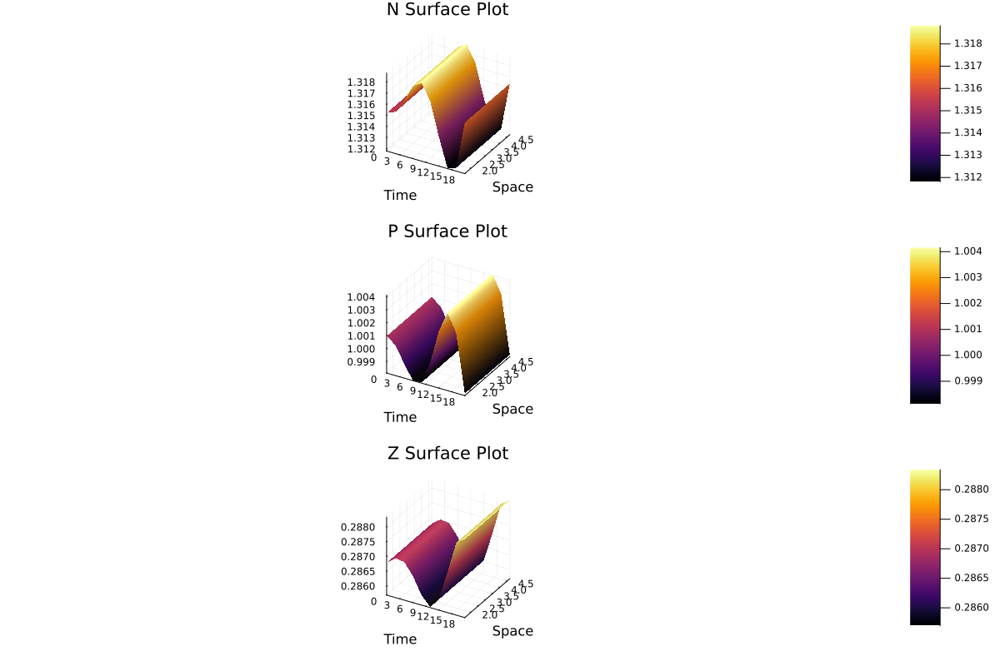

In [9]:
surface_plot_3D(N_data,P_data,Z_data,times,space)

## Cos(x)

In [25]:
N_data,P_data,Z_data,times,space= key_variable_outcome_3D(29, model, "NPZ.jld2");

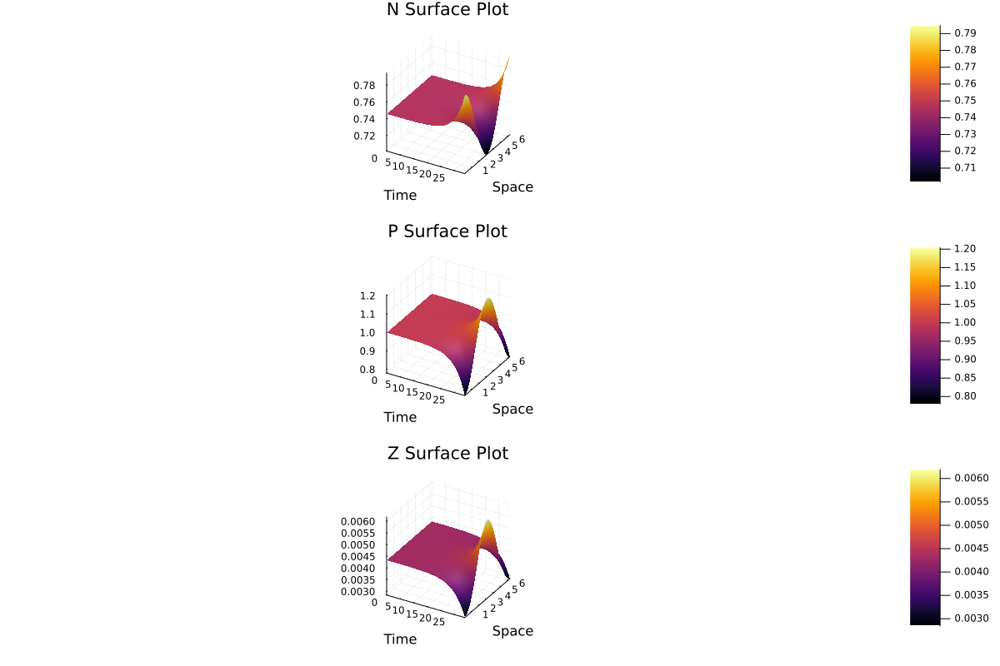

In [26]:
surface_plot_3D(N_data,P_data,Z_data,times,space)

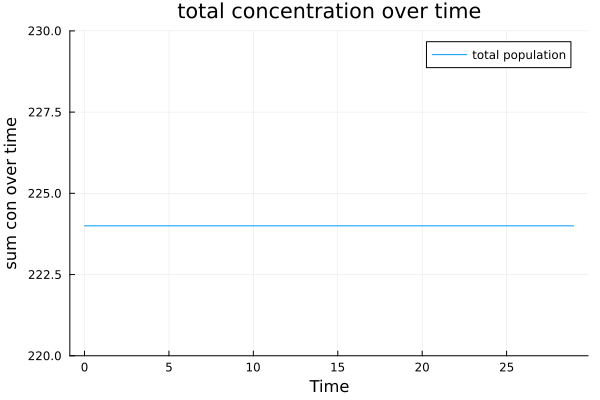

In [33]:
conservation_plot_3D(N_data,P_data,Z_data,times,space)

Growth rate of N is approximately 0.2653905041206703
Growth rate of P is approximately 0.2653636802775753
Growth rate of Z is approximately 0.2653744928788277
Largest real part of e-value 0.265375647916469

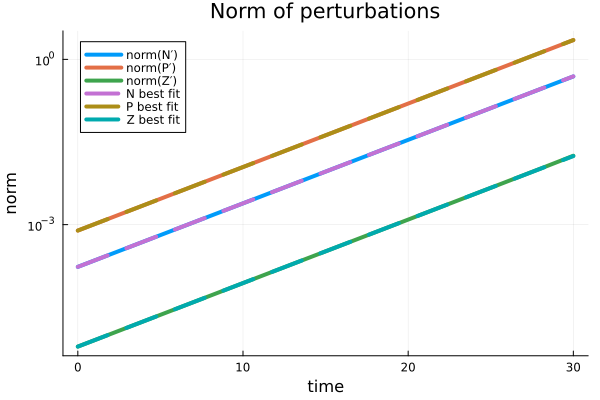

In [28]:
experiment_growth_rate_3D("NPZgrowth.nc",total_population_mode1, λ, ν, δ, g, m, d₁, d₂, d₃, k)

In [29]:
## Eigenvector
(real(ODE_PDE_system_3D(total_population_mode1, λ, ν, δ, g, m, d₁, d₂, d₃, k)[1][4][1]), real(ODE_PDE_system_3D(total_population_mode1, λ, ν, δ, g, m, d₁, d₂, d₃, k)[1][4][2]),real(ODE_PDE_system_3D(total_population_mode1, λ, ν, δ, g, m, d₁, d₂, d₃, k)[1][4][3]))

(0.2142306346608346, -0.97675310315975, -0.007655758657032439)

## Cos(3x)

In [38]:
N_data,P_data,Z_data,times,space= key_variable_outcome_3D(29, model, "NPZ.jld2");

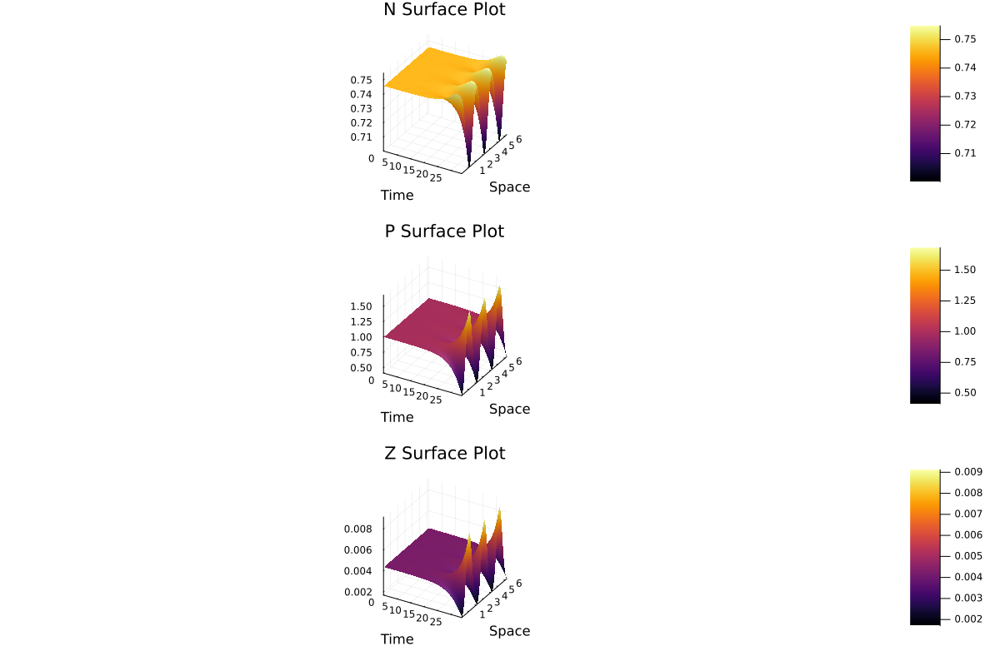

In [39]:
surface_plot_3D(N_data,P_data,Z_data,times,space)

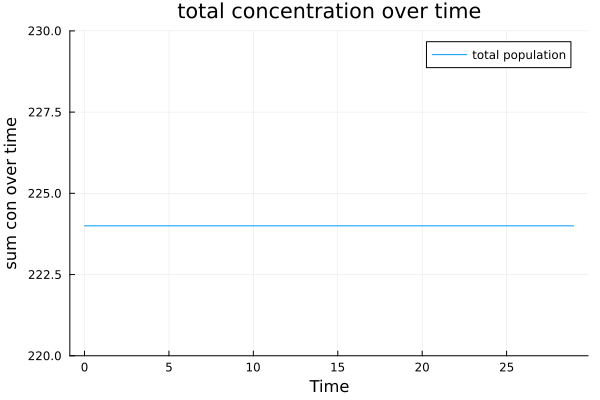

In [40]:
conservation_plot_3D(N_data,P_data,Z_data,times,space)

Growth rate of N is approximately 0.3038836878749602
Growth rate of P is approximately 0.3038661136228557
Growth rate of Z is approximately 0.3038947899490172
Largest real part of e-value 0.303749081675561

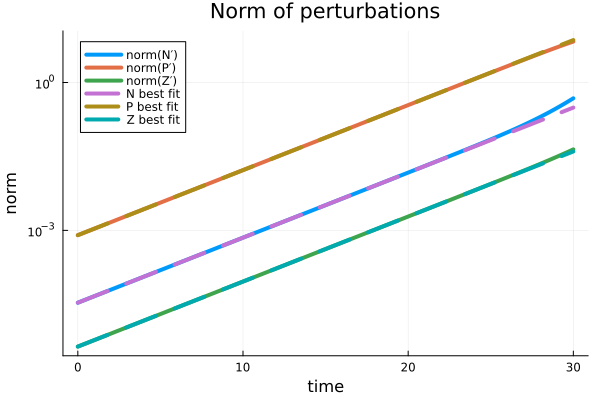

In [41]:
experiment_growth_rate_3D("NPZgrowth.nc",total_population_mode1, λ, ν, δ, g, m, d₁, d₂, d₃, k)

In [42]:
## Eigenvector
(real(ODE_PDE_system_3D(total_population_mode1, λ, ν, δ, g, m, d₁, d₂, d₃, k)[1][4][1]), real(ODE_PDE_system_3D(total_population_mode1, λ, ν, δ, g, m, d₁, d₂, d₃, k)[1][4][2]),real(ODE_PDE_system_3D(total_population_mode1, λ, ν, δ, g, m, d₁, d₂, d₃, k)[1][4][3]))

(0.04251442749185207, -0.9990808427963004, -0.0054765876669874225)

## Cos(5x)

In [47]:
N_data,P_data,Z_data,times,space= key_variable_outcome_3D(29, model, "NPZ.jld2");

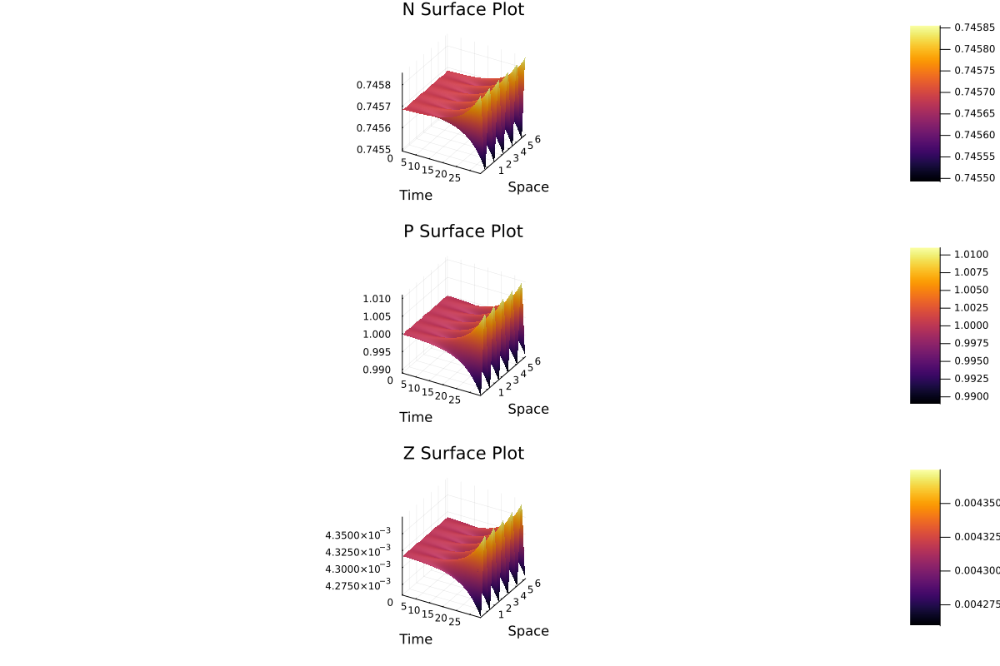

In [48]:
surface_plot_3D(N_data,P_data,Z_data,times,space)

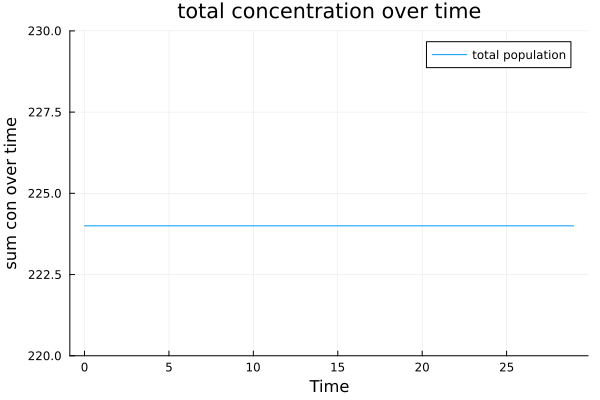

In [49]:
conservation_plot_3D(N_data,P_data,Z_data,times,space)

Growth rate of N is approximately 0.16232886063386098
Growth rate of P is approximately 0.16232859513768988
Growth rate of Z is approximately 0.16236010563177164
Largest real part of e-value 0.1611284355767085

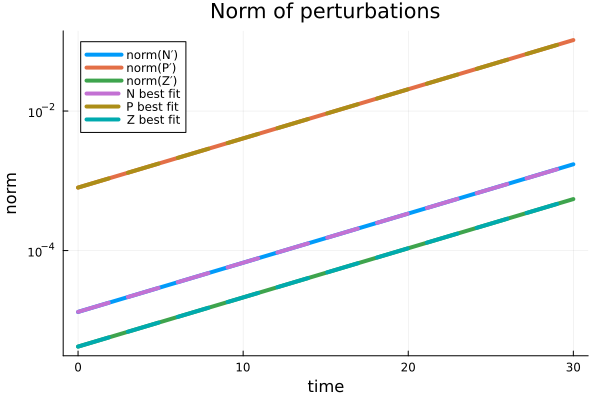

In [50]:
experiment_growth_rate_3D("NPZgrowth.nc",total_population_mode1, λ, ν, δ, g, m, d₁, d₂, d₃, k)

In [51]:
## Eigenvector
(real(ODE_PDE_system_3D(total_population_mode1, λ, ν, δ, g, m, d₁, d₂, d₃, k)[1][4][1]), real(ODE_PDE_system_3D(total_population_mode1, λ, ν, δ, g, m, d₁, d₂, d₃, k)[1][4][2]),real(ODE_PDE_system_3D(total_population_mode1, λ, ν, δ, g, m, d₁, d₂, d₃, k)[1][4][3]))

(0.016423165903702974, -0.9998513521077643, -0.005249124686560066)

## Cos(7x)

In [63]:
N_data,P_data,Z_data,times,space= key_variable_outcome_3D(20, model, "NPZ.jld2");

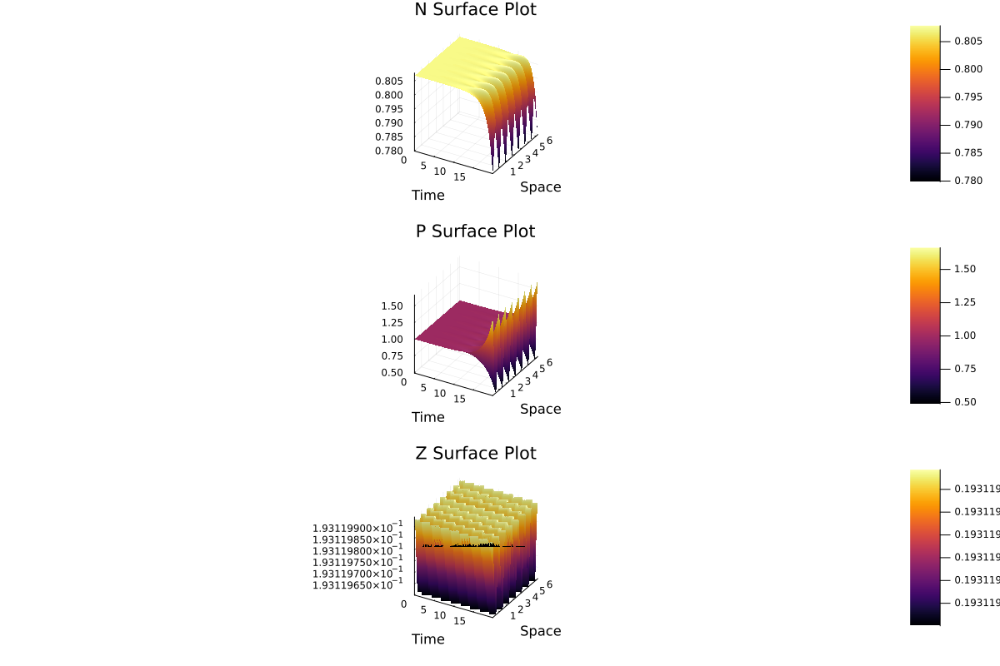

In [64]:
surface_plot_3D(N_data,P_data,Z_data,times,space)

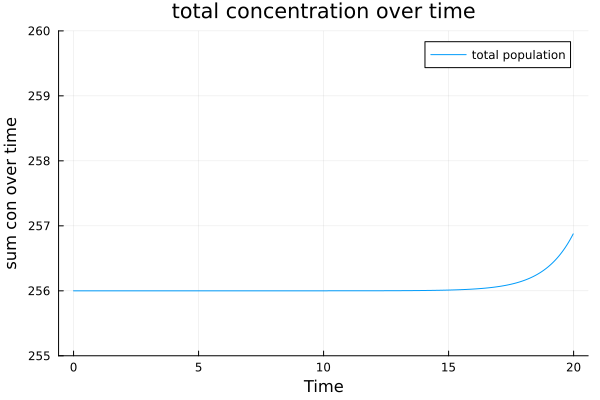

In [65]:
conservation_plot_3D(N_data,P_data,Z_data,times,space)

Growth rate of N is approximately 0.43751213154523105
Growth rate of P is approximately 0.4367904326269993
Growth rate of Z is approximately 1.9405554803545257e-15
Largest real part of e-value 0.2188583985584689

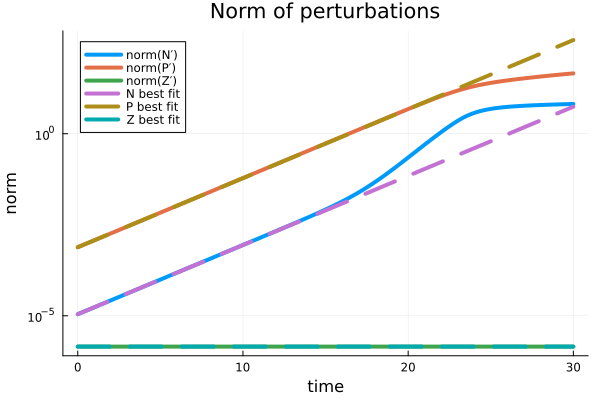

In [66]:
experiment_growth_rate_3D("NPZgrowth.nc",total_population_mode1, λ, ν, δ, g, m, d₁, d₂, d₃, k)

In [67]:
## Eigenvector
(real(ODE_PDE_system_3D(total_population_mode1, λ, ν, δ, g, m, d₁, d₂, d₃, k)[1][4][1]), real(ODE_PDE_system_3D(total_population_mode1, λ, ν, δ, g, m, d₁, d₂, d₃, k)[1][4][2]),real(ODE_PDE_system_3D(total_population_mode1, λ, ν, δ, g, m, d₁, d₂, d₃, k)[1][4][3]))

(-0.00817401163804082, 0.9542204206917817, 0.21227007544800322)

## Growth Rate vs Wave number k

In [ ]:
Nₜ = 1.75:0.01:3
λ, ν = 0.85, 2
δ, g, m = 1, 2, 1/2
d₂, d₃, k = 0.01, 0.01, 5
d₁ = 1

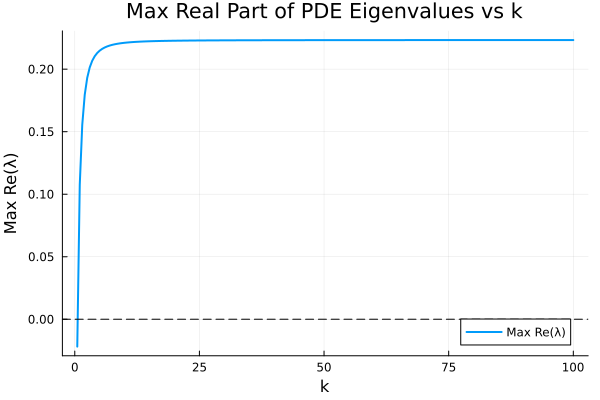

In [22]:
k_values=0.5:0.5:100
plot_pde_eigenvalues_3D(total_population_mode1, λ, ν, δ, g, m, d₁, d₂, d₃, k_values)